# Object Detection - Bees

In [16]:
# install necessary packages
!pip3 install tensorflow_hub

  Using cached tensorflow_hub-0.12.0-py2.py3-none-any.whl (108 kB)
You should consider upgrading via the '/Library/Frameworks/Python.framework/Versions/3.8/bin/python3 -m pip install --upgrade pip' command.


In [1]:
# For running inference on the TF-Hub module.
import tensorflow as tf
import tensorflow_hub as hub
import ssl
ssl._create_default_https_context = ssl._create_unverified_context

# For downloading the image.
import matplotlib.pyplot as plt
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO

# For drawing onto the image.
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

# For measuring the inference time.
import time

# Print Tensorflow version
print(tf.__version__)

# Check available GPU devices.
print("The following GPU devices are available: %s" % tf.test.gpu_device_name())

2.6.0
The following GPU devices are available: 


In [2]:
# helper visualization functions 
def display_image(image):
    fig = plt.figure(figsize=(20, 15))
    plt.grid(False)
    plt.imshow(image)


def download_and_resize_image(url, new_width=256, new_height=256,
                              display=False):
    _, filename = tempfile.mkstemp(suffix=".jpg")
    response = urlopen(url)
    image_data = response.read()
    image_data = BytesIO(image_data)
    pil_image = Image.open(image_data)
    pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS)
    pil_image_rgb = pil_image.convert("RGB")
    pil_image_rgb.save(filename, format="JPEG", quality=90)
    print("Image downloaded to %s." % filename)
    if display:
        display_image(pil_image)
    return filename


def draw_bounding_box_on_image(image,
                               ymin,
                               xmin,
                               ymax,
                               xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
    """Adds a bounding box to an image."""
    draw = ImageDraw.Draw(image)
    im_width, im_height = image.size
    (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)
    draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

    # If the total height of the display strings added to the top of the bounding
    # box exceeds the top of the image, stack the strings below the bounding box
    # instead of above.
    display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
    # Each display_str has a top and bottom margin of 0.05x.
    total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

    if top > total_display_str_height:
        text_bottom = top
    else:
        text_bottom = top + total_display_str_height
    # Reverse list and print from bottom to top.
    for display_str in display_str_list[::-1]:
        text_width, text_height = font.getsize(display_str)
        margin = np.ceil(0.05 * text_height)
        draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                        (left + text_width, text_bottom)],
                       fill=color)
        draw.text((left + margin, text_bottom - text_height - margin),
                  display_str,
                  fill="black",
                  font=font)
        text_bottom -= text_height - 2 * margin


def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
    """Overlay labeled boxes on an image with formatted scores and label names."""
    colors = list(ImageColor.colormap.values())

    try:
        font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
    except IOError:
        print("Font not found, using default font.")
        font = ImageFont.load_default()

    for i in range(min(boxes.shape[0], max_boxes)):
        if scores[i] >= min_score:
            ymin, xmin, ymax, xmax = tuple(boxes[i])
            display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                         int(100 * scores[i]))
            color = colors[hash(class_names[i]) % len(colors)]
            image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
            draw_bounding_box_on_image(
              image_pil,
              ymin,
              xmin,
              ymax,
              xmax,
              color,
              font,
              display_str_list=[display_str])
            np.copyto(image, np.array(image_pil))
    return image

In [3]:
# helper functions for model prediction
def load_img(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    return img

def run_detector(detector, path):
    img = load_img(path)
    converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]
    start_time = time.time()
    result = detector(converted_img)
    end_time = time.time()

    result = {key:value.numpy() for key,value in result.items()}

    print("Found %d objects." % len(result["detection_scores"]))
    print("Inference time: ", end_time-start_time)

    image_with_boxes = draw_boxes(
        img.numpy(), result["detection_boxes"],
        result["detection_class_entities"], result["detection_scores"])

    display_image(image_with_boxes)
    return result

Image downloaded to /var/folders/rv/l247c82x189_2095r1ddvjxw0000gn/T/tmp09nj6_ku.jpg.


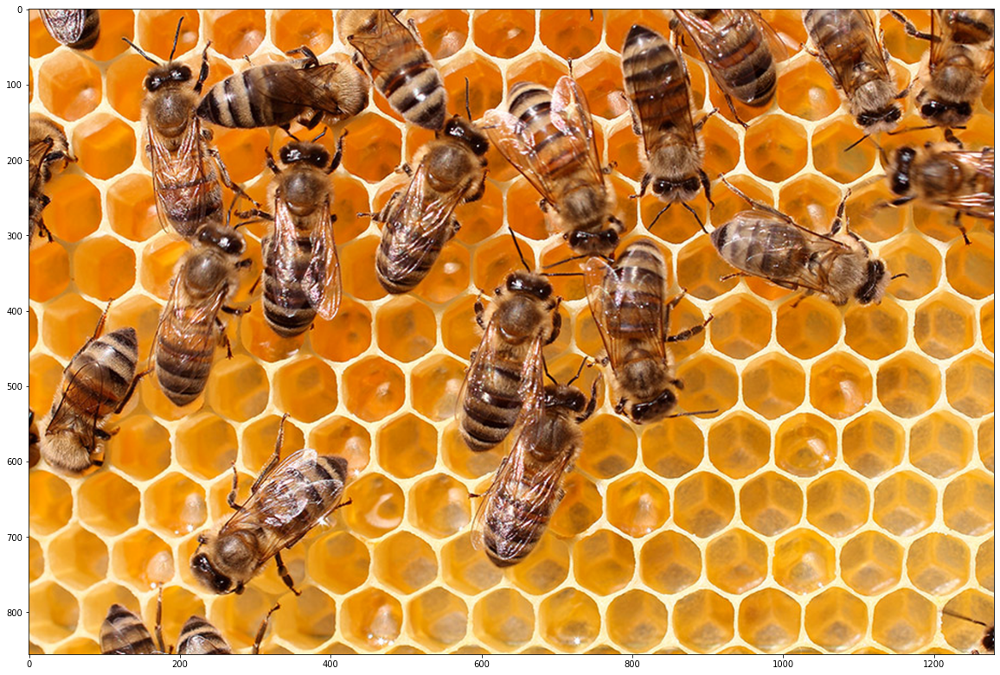

In [4]:
image_url = "https://www.libelium.com/wp-content/uploads/2015/02/monitoring-beehives-bees.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)

## Predict with pretrained object detection model

In [170]:
# # load model locally
# hub_module = hub.load('../data/06_models/faster_rcnn_openimages_v4_inception_resnet_v2_1').signatures['default']

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [6]:
# load model remotely
# if SAVEDFILE not found error, follow steps in: https://stackoverflow.com/questions/63078695/savedmodel-file-does-not-exist-when-using-tensorflow-hub
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"
detector = hub.load(module_handle).signatures['default']

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [7]:
# load model remotely
# if SAVEDFILE not found error, follow steps in: https://stackoverflow.com/questions/63078695/savedmodel-file-does-not-exist-when-using-tensorflow-hub
module_handle = "https://tfhub.dev/google/openimages_v4/ssd/mobilenet_v2/1"
detector = hub.load(module_handle).signatures['default']

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


Found 100 objects.
Inference time:  8.001659154891968
Font not found, using default font.


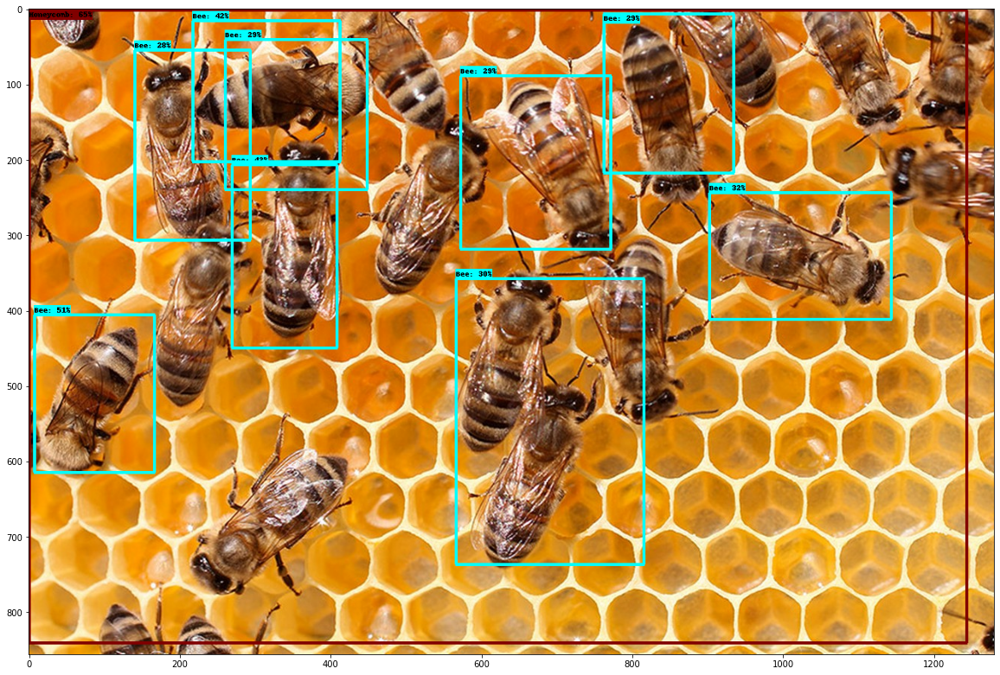

In [8]:
result = run_detector(detector, downloaded_image_path)

## Detect only bees and insects

Let's first inspect the model's result object. We need predicted label, confidence score, and bounding box coordinates.

In [143]:
result.keys()

dict_keys(['detection_class_entities', 'detection_scores', 'detection_class_labels', 'detection_class_names', 'detection_boxes'])

In [68]:
print(result["detection_class_entities"]) # predicted labels

[b'Bee' b'Bee' b'Bee' b'Bee' b'Bee' b'Bee' b'Honeycomb' b'Bee' b'Bee'
 b'Bee' b'Bee' b'Bee' b'Honeycomb' b'Bee' b'Bee' b'Bee' b'Bee' b'Bee'
 b'Bee' b'Bee' b'Bee' b'Honeycomb' b'Insect' b'Bee' b'Bee' b'Beehive'
 b'Bee' b'Bee' b'Beehive' b'Bee' b'Bee' b'Bee' b'Bee' b'Bee' b'Bee' b'Bee'
 b'Bee' b'Bee' b'Isopod' b'Food' b'Beehive' b'Fruit' b'Dessert' b'Bee'
 b'Bee' b'Bee' b'Bee' b'Bee' b'Food' b'Snack' b'Bee' b'Bee'
 b'Invertebrate' b'Bee' b'Ant' b'Bee' b'Bee' b'Bee' b'Fashion accessory'
 b'Insect' b'Bee' b'Bee' b'Insect' b'Insect' b'Insect' b'Bird'
 b'Shellfish' b'Insect' b'Tick' b'Beetle' b'Baked goods' b'Insect'
 b'Insect' b'Bee' b'Fruit' b'Insect' b'Insect' b'Flower' b'Orange'
 b'Insect' b'Vehicle' b'Food' b'Fruit' b'Insect' b'Bee' b'Bee'
 b'Fast food' b'Dessert' b'Bee' b'Bee' b'Fish' b'Insect' b'Animal'
 b'Insect' b'Snail' b'Mushroom' b'Vegetable' b'Bee' b'Pumpkin' b'Food']


In [53]:
"""
returns normalized [ymin, xmin, ymax, xmax].

Upper left coordinate: (xmin, ymin)
bottom right coordinate: (xmax, ymax) 

if an image is 100 x 200 pixels (height x width) and the bounding box is [0.1, 0.2, 0.5, 0.9], 
the upper-left and bottom-right coordinates of the bounding box will be (40, 10) to (180, 50) (in (x,y) coordinates).
"""
print(result['detection_boxes'])

[[9.1328785e-02 2.3341362e-01 3.5269162e-01 3.9477724e-01]
 [1.4029373e-01 2.4453811e-02 1.0000000e+00 1.0000000e+00]
 [4.3934613e-01 2.3829986e-01 6.3026786e-01 4.2842117e-01]
 [6.7155403e-01 3.2045758e-01 9.5134360e-01 4.9457699e-01]
 [3.1644437e-01 3.5861123e-01 5.3853345e-01 5.3709394e-01]
 [6.8136498e-02 0.0000000e+00 9.9647605e-01 6.2525833e-01]
 [6.5054581e-02 4.2259833e-01 1.0000000e+00 9.9470204e-01]
 [5.4632038e-01 0.0000000e+00 1.0000000e+00 6.0833299e-01]
 [3.5994154e-01 0.0000000e+00 1.0000000e+00 4.7543219e-01]
 [7.8597769e-02 5.3786162e-02 1.0000000e+00 5.8423948e-01]
 [7.1997330e-02 4.4404641e-02 1.0000000e+00 9.5965344e-01]
 [4.0449050e-01 3.1390780e-01 5.1581770e-01 3.9482951e-01]
 [7.0969975e-01 8.2531995e-01 8.0777675e-01 9.0570998e-01]
 [2.0977020e-02 4.7098929e-01 1.0000000e+00 9.5745856e-01]
 [3.7997901e-01 4.6043776e-02 1.0000000e+00 7.9264027e-01]
 [9.0571576e-01 8.4738730e-04 9.8887414e-01 4.0186040e-02]
 [1.5094998e-01 6.7152274e-01 2.4190445e-01 7.4074805e-0

In [125]:
result["detection_scores"] # prediction confidence scores

array([0.9374921 , 0.93548477, 0.914173  , 0.91395074, 0.8752681 ,
       0.8467478 , 0.8348919 , 0.83110684, 0.82361877, 0.79456234,
       0.7563688 , 0.700965  , 0.6938923 , 0.6935628 , 0.66483074,
       0.6625829 , 0.64176726, 0.5496839 , 0.44315264, 0.41900837,
       0.3499544 , 0.32561502, 0.32406425, 0.20106845, 0.19881284,
       0.12238446, 0.11921205, 0.11898822, 0.10211917, 0.09228403,
       0.08910879, 0.0832095 , 0.0801412 , 0.0769036 , 0.07637349,
       0.07344528, 0.06721478, 0.0655309 , 0.0654698 , 0.06519564,
       0.05691039, 0.05675022, 0.03288636, 0.03034071, 0.02713848,
       0.02660891, 0.02450013, 0.02300419, 0.02283624, 0.02008655,
       0.01991   , 0.01742234, 0.01708149, 0.01670592, 0.01640512,
       0.01614477, 0.0123953 , 0.01217188, 0.01212245, 0.0113546 ,
       0.00980935, 0.00942682, 0.00900237, 0.00880976, 0.00874572,
       0.0077968 , 0.00765992, 0.0072366 , 0.00644827, 0.00630062,
       0.00604262, 0.0057651 , 0.00524943, 0.00513935, 0.00471

In [15]:
def filter_bees(result, min_score=0.2):
    print(f"Total {len(result['detection_boxes'])} objects detected.")
    # filter by only bees or insect labeled objects
    bee_idx = [idx for idx, ele in enumerate(result["detection_class_entities"]) if ele == b"Bee" or ele == b"Insect"]
    print(f"Among them, a total of {len(bee_idx)} are classified as bee or insect.")
    # filter by high confidence score
    bee_idx_high_conf = [ele for ele in bee_idx if (result["detection_scores"][ele] >= min_score)]
    print(f"Among them, a total of {len(bee_idx_high_conf)} have prediction confidence score of at least {min_score}.")
    
    # filter result object
    result_bees = {'detection_class_entities':[],
                  'detection_scores':[],
                  'detection_boxes':[]}
    
    for idx in bee_idx_high_conf:
        result_bees['detection_class_entities'].append(result['detection_class_entities'][idx]) 
        result_bees['detection_scores'].append(result['detection_scores'][idx])
        result_bees['detection_boxes'].append(result['detection_boxes'][idx]) 
    return result_bees

In [16]:
result_bees = filter_bees(result)

Total 100 objects detected.
Among them, a total of 95 are classified as bee or insect.
Among them, a total of 24 have prediction confidence score of at least 0.2.


In [17]:
result_bees['detection_scores']

[0.5168401,
 0.43567225,
 0.4209297,
 0.32000157,
 0.30442405,
 0.29966885,
 0.2994182,
 0.29299894,
 0.28035265,
 0.27226883,
 0.26487118,
 0.26237237,
 0.25799805,
 0.2539904,
 0.24891776,
 0.24101514,
 0.23200136,
 0.22286585,
 0.22151011,
 0.22060776,
 0.21859393,
 0.2165826,
 0.21497038,
 0.20635587]

## Crop and Save detected bee images

In [19]:
# get image basic information
img = load_img(downloaded_image_path)
img_height, img_width = img.shape[:2]

In [18]:
# help from https://stackoverflow.com/a/55205421

def crop_bee(detection_box, img, img_height=None, img_width=None, detection_score=None, display=False):    
    
    if (img_height == None) or (img_width == None):
        img_height, img_width = img.shape[:2]
    
    ymin, xmin, ymax, xmax = detection_box
    
    x_up = int(xmin*img_width)
    y_up = int(ymin*img_height)
    x_down = int(xmax*img_width)
    y_down = int(ymax*img_height)
    
    img = img[y_up:y_down, x_up:x_down,:]
    
    if display == True:
        plt.figure()
        plt.imshow(img)
    return img

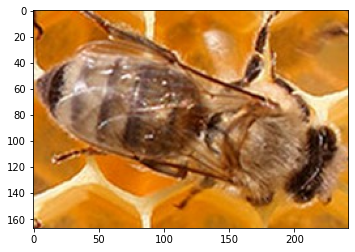

In [20]:
cropped_bee_img = crop_bee(result_bees['detection_boxes'][3], img, display=True)

<ipython-input-18-59fdc4b49760>:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


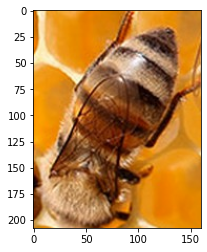

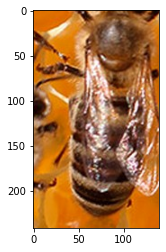

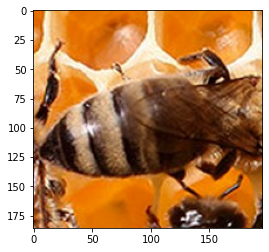

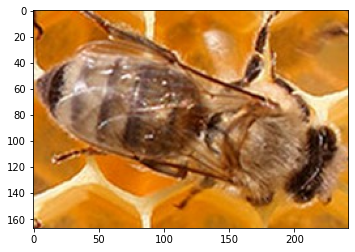

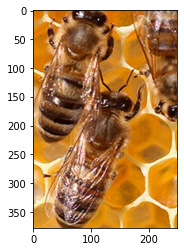

...

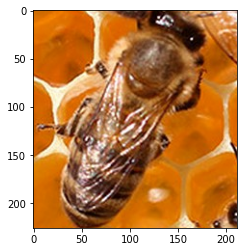

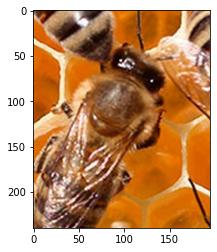

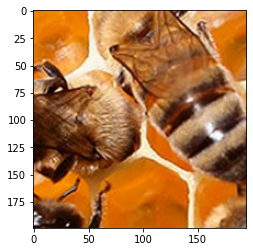

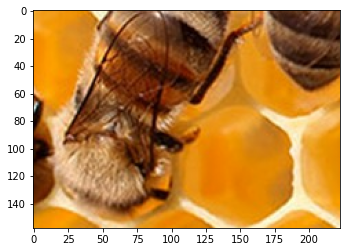

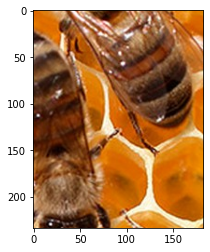

In [21]:
for bee_box in result_bees['detection_boxes']:
    _ = crop_bee(bee_box, img, display=True)

## Try out other beehive images!

In [51]:
image_urls = [
    "https://cdn.mos.cms.futurecdn.net/HixjyeXYJCrSDVGkZTmprP-1024-80.jpg",
    "https://5.imimg.com/data5/WD/CH/MY-76154918/stingless-bee-honey-500x500.jpg",
    ]

def detect_img(image_url):
    start_time = time.time()
    image_path = download_and_resize_image(image_url, 640, 480)
    result = run_detector(detector, image_path)
    end_time = time.time()
    print("Inference time:",end_time-start_time)
    return result

Image downloaded to /var/folders/rv/l247c82x189_2095r1ddvjxw0000gn/T/tmpdgzvs_2o.jpg.
Found 100 objects.
Inference time:  7.985828161239624
Font not found, using default font.
Inference time: 8.129979848861694


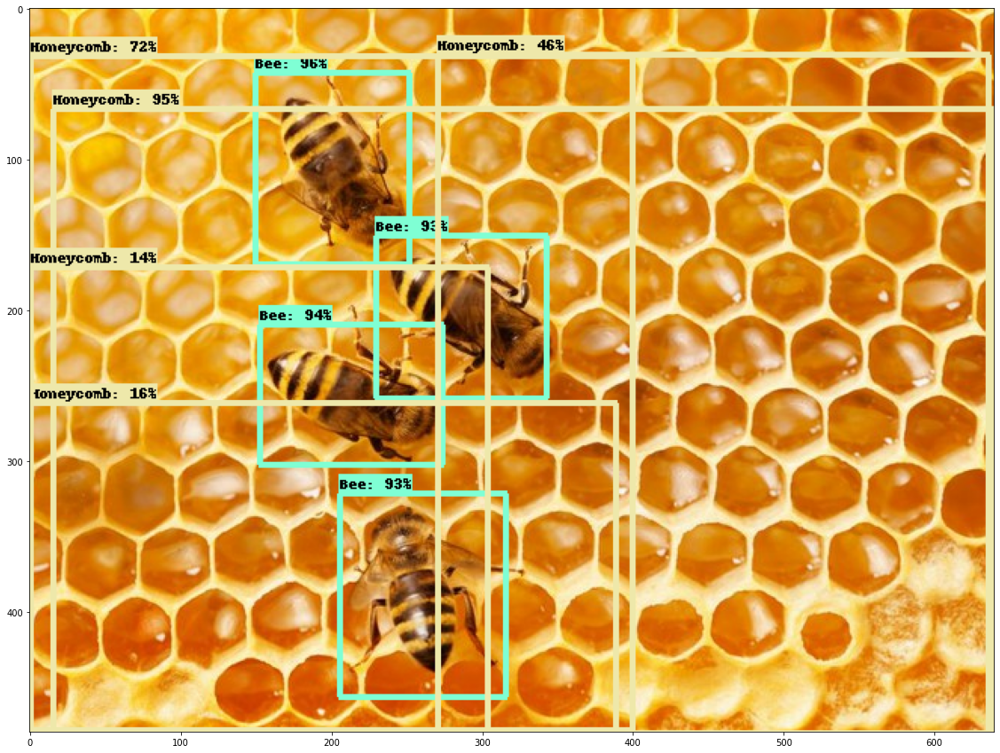

In [52]:
result = detect_img(image_urls[0])

Image downloaded to /var/folders/rv/l247c82x189_2095r1ddvjxw0000gn/T/tmp07clukpw.jpg.
Found 100 objects.
Inference time:  10.261487245559692
Font not found, using default font.
Inference time: 15.002493143081665


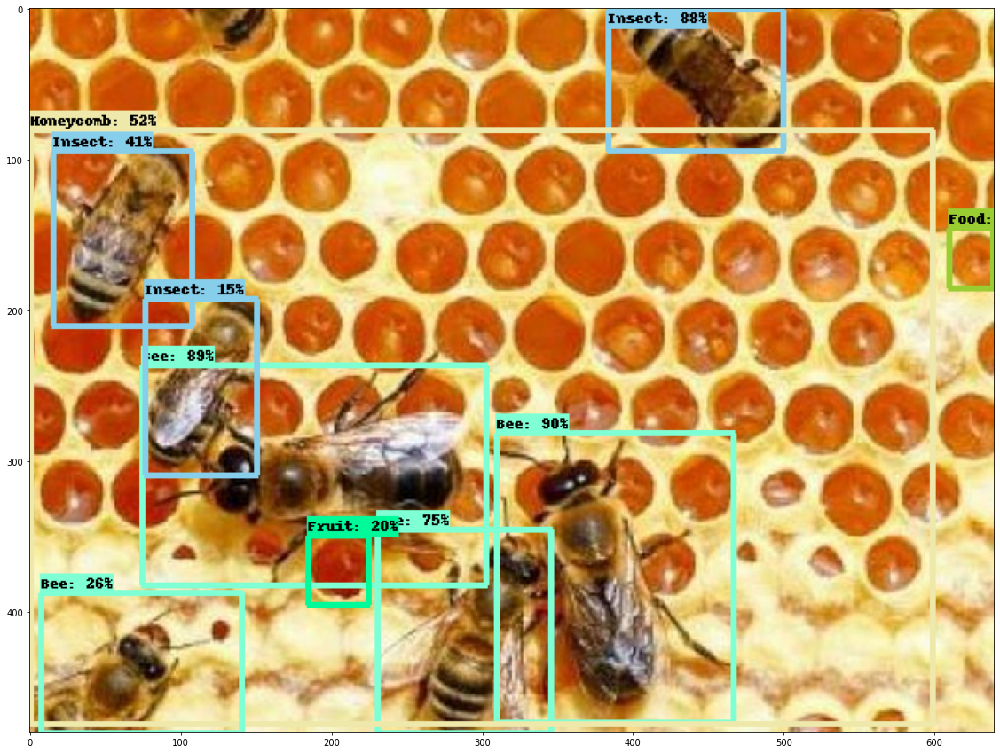

In [42]:
result = detect_img(image_urls[1])

## References
1. TensorFlow Object Detection Tutorial - https://www.tensorflow.org/hub/tutorials/object_detection